# Assignment 1:  SLIC Superpixels.

Name: **Gokul Hari**

UID:  **117430646**

Link to Google Drive : **https://drive.google.com/file/d/1nvKzc1u0bdE2TP2RBiUTl0YGO2suPPyz/view?usp=sharing**

Please submit a PDF containing all outputs to gradescope by **October 12, 5pm**

----------------------------

In this assignment, you will learn about superpixels. You will first generate superpixels by clustering pixels via k-means. This will generate a superpixel map such as the following:

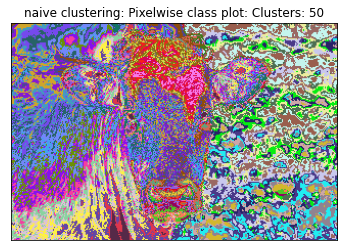

You will make some adjustments to your k-means clustering. After reflection, you will then implement a better superpixel algorithm: SLIC, which lets you generate superpixel maps like the following:

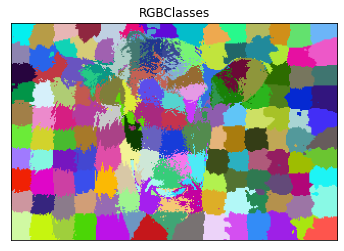

## Data

First, we download the MSRC labeled imaged database.

In [1]:
# !wget http://download.microsoft.com/download/A/1/1/A116CD80-5B79-407E-B5CE-3D5C6ED8B0D5/msrc_objcategimagedatabase_v1.zip
# !unzip --qq msrc_objcategimagedatabase_v1.zip

For this assignment, we will only use the following images. We define the list below as `im_list`.

In [2]:
im_list = ['MSRC_ObjCategImageDatabase_v1/1_22_s.bmp',
           'MSRC_ObjCategImageDatabase_v1/1_27_s.bmp',
           'MSRC_ObjCategImageDatabase_v1/3_3_s.bmp',
           'MSRC_ObjCategImageDatabase_v1/3_6_s.bmp',
           'MSRC_ObjCategImageDatabase_v1/6_5_s.bmp',
           'MSRC_ObjCategImageDatabase_v1/7_19_s.bmp']

We provide the following functions as helpers for plotting your results. Please pay attention to their signatures and outputs.





In [3]:
#All important functions to plot
%matplotlib inline
import cv2
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.patches as mpatches

def plot6(im_list):
    f, plts = plt.subplots(2,3,figsize = (15,7))
    plts[0][0].imshow(im_list[0][0])
    plts[0][1].imshow(im_list[1][0])
    plts[0][2].imshow(im_list[2][0])
    plts[1][0].imshow(im_list[3][0])
    plts[1][1].imshow(im_list[4][0])
    plts[1][2].imshow(im_list[5][0])

def plot_image(im,title,xticks=[],yticks= [],isCv2 = True):
    """
    im :Image to plot
    title : Title of image 
    xticks : List of tick values. Defaults to nothing
    yticks :List of tick values. Defaults to nothing 
    cv2 :Is the image cv2 image? cv2 images are BGR instead of RGB. Default True
    """
    plt.figure()
    if isCv2:
        im = im[:,:,::-1]
    plt.imshow(im)
    plt.title(title)
    plt.xticks(xticks)
    plt.yticks(yticks)

def superpixel_plot(im,seg,title = "Superpixels"):
    """
    Given an image (nXmX3) and pixelwise class mat (nXm), 
    1. Consider each class as a superpixel
    2. Calculate mean superpixel value for each class
    3. Replace the RGB value of each pixel in a class with the mean value  
    
    Inputs:
    im: Input image
    seg: Segmentation map
    title: Title of the plot 
    
    Output: None
    Creates a plot    
    """
    clust = np.unique(seg)
    mapper_dict = {i: im[seg == i].mean(axis = 0)/255. for i in clust}

    seg_img =  np.zeros((seg.shape[0],seg.shape[1],3))
    for i in clust:
        seg_img[seg == i] = mapper_dict[i]
    
    plot_image(seg_img,title)
    
    return    

def rgb_segment(seg,n = None,plot = True,title=None,legend = True,color = None):
    """
    Given a segmentation map, get the plot of the classes
    """
    clust = np.unique(seg)
    if n is None:
        n = len(clust)
    if color is None:
        cm = plt.cm.get_cmap('hsv',n+1)
        # mapper_dict = {i:np.array(cm(i/n)) for i in clust}
        mapper_dict = {i:np.random.rand(3,) for i in clust} 
    #elif color == 'mean':
        #TODO..get the mean color of cluster center and assign that to mapper_dict

    seg_img =  np.zeros((seg.shape[0],seg.shape[1],3))
    for i in clust:
        seg_img[seg == i] = mapper_dict[i][:3]

    if plot: 
        plot_image(seg_img,title = title)
    if legend:
        # get the colors of the values, according to the 
        # colormap used by imshow
        patches = [ mpatches.Patch(color=mapper_dict[i], label=" : {l}".format(l=i) ) for i in range(n) ]
        # put those patched as legend-handles into the legend
        plt.legend(handles=patches, bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0. )
        plt.grid(True)
        plt.show()

    return seg_img

For example, the following code uses `plot_image` to plot the 6 images we are using for this assignment.

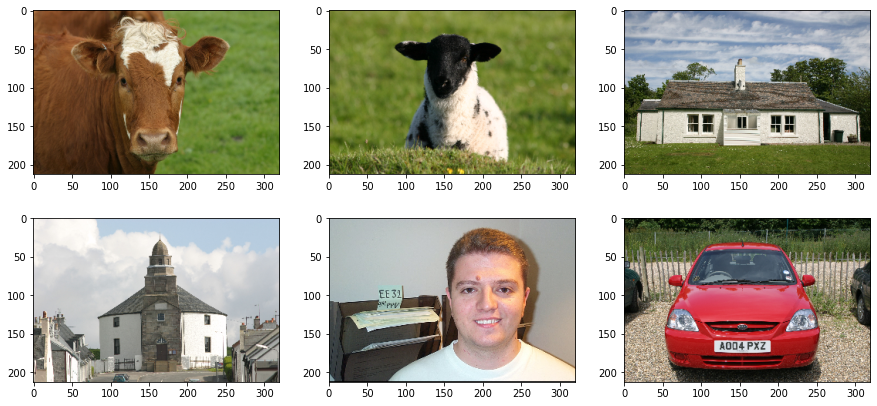

In [4]:
image_list = []
for i in im_list:
    im = cv2.imread(i)
    image_list.append([im[:,:,::-1], str(i.split("/")[-1])]) 
plot6(image_list)
image_list= []


## Part 1: K-means on Image Pixels

For this portion of the assignment, you will attempt to identify superpixels by using k-means with various attributes of the image's pixels as inputs (r, g, b, and/or x, y).


In [12]:
# KMEANS FUNCTIONS  
import math
class Clusters:
    def __init__(self, k):
        self.rgbxy = []        
        self.rgbxy_data = dict([(key, []) for key in range(k)])
        self.centroids = dict([(key, []) for key in range(k)])
    def addnode(self, rgb, xy):
        data = np.append(rgb, xy).astype(np.float32)
        self.rgbxy.append(data)
    def append(self, index, rgb, xy):
        data = np.append(rgb, xy).astype(np.float32)
        self.rgbxy_data[index].append(data)
    def __len__(self):
        return len(self.rgbxy)

def process(im, seg_map, clusters, wrgb= 1.0, wxy = 0.0):
    # read the pixel color and positions in all clusters 
    cpixels, cpositions = np.array(clusters.rgbxy)[:,:3], np.array(clusters.rgbxy)[:,3:] 
    h,w = im.shape[:2]

    # generate the label map by clustering based on nearest distance 
    for i in range(h):
        for j in range(w):
            # find the closest cluster for this pixel 
            rgb = im[i,j]
            drgb = np.linalg.norm((cpixels - rgb), axis=1)
            dxy = np.linalg.norm((cpositions - [i,j]), axis=1) 
            dist = np.sqrt(wrgb * drgb**2 + wxy* dxy**2 )  
            min_cluster_ind = np.argmin(dist)
            
            # append the rgb value and its position in the corresponding cluster
            clusters.append(min_cluster_ind,rgb,[i,j])
            seg_map[i,j] = min_cluster_ind+1

    # update clusters mean rgb and center 
    for i in range(len(clusters)):
        data = clusters.rgbxy_data[i]
        if len(data) > 0:
            mean_val = np.mean(data, axis=0)
            clusters.rgbxy[i] = mean_val
            clusters.rgbxy_data[i] = []
    return seg_map, clusters


def initialize(im, k):
    # randomly sample pixels and thier colors from the image
    x = np.random.randint(0, im.shape[0], size=(k))
    y = np.random.randint(0, im.shape[1], size=(k))
    
    xy = np.dstack((x, y)).squeeze()
    pixels = im[x, y]

    clusters = Clusters(k)
    for i in range(k):
        clusters.addnode(pixels[i], xy[i])
    return clusters


def objective(curr_clusters, prev_clusters, wrgb, wxy, threshold=5): 
    # compute weighted  distance between color and position
    rgbnorm = wrgb * np.linalg.norm(np.array(curr_clusters)[:, :3] - np.array(prev_clusters)[:, :3], axis=1).sum()
    xynorm = wxy * np.linalg.norm(np.array(curr_clusters)[:, 3:] - np.array(prev_clusters)[:, 3:], axis=1).sum()
    norm = rgbnorm + xynorm
    return norm 

def KMeans(im,k, n_iters=5, wrgb= 1.0, wxy = 1.0, threshold = 100.0):    
    # initialise clusters and labels
    seg_map = -1 * np.ones((im.shape[0], im.shape[1]))
    clusters = initialize(im, k)
    prev_clusters, curr_clusters= [],[]
    iteration = 0
    norm = np.inf
    # optimize until converges
    while not norm<=threshold and iteration<=n_iters:
        prev_clusters = clusters.rgbxy.copy() 
        seg_map, clusters = process(im, seg_map, clusters, wrgb, wxy)
        curr_clusters = clusters.rgbxy
        iteration+=1
        norm = objective(prev_clusters, curr_clusters, wrgb, wxy, threshold)
        print(f' Iteration: {iteration}, norm {norm}' )
    print(f"DONE. Threshold was: {threshold} ")
    return seg_map

def cluster_pixels(im,k, n_iters=20):    
    # making threshold as a function of k
    threshold = k*2 
    segmap = KMeans(im,k, n_iters, wrgb= 1.0, wxy = 0.0, threshold = threshold)
    return segmap

## Question 1: Perform k-means on image pixels `(r, g, b)`. (20 points)
 
The k-means clustering algorithm is an unsupervised algorithm which, for some items and for some specified number of clusters represented by cluster centers, minimizes the distance between items and their associated cluster centers. It does so by iteratively assigning items to a cluster and recomputing the cluster center based on the assigned items.

Complete the pixel clustering function. It should take input an image (shape = `(n, m, 3)`) and number of clusters. Each pixel should be represented by a vector with 3 values: `(r, g, b)`.

Then, let our provided code plot the pixelwise and superpixel plots for the cow image (`1_22_s.bmp`), using your `cluster_pixels` implementation with the provided values for the number of clusters: `5, 10, 50`.




 Iteration: 1, norm 123.42192077636719
 Iteration: 2, norm 46.54417419433594
 Iteration: 3, norm 26.46148109436035
 Iteration: 4, norm 22.688753128051758
 Iteration: 5, norm 28.55268669128418
 Iteration: 6, norm 42.42697525024414
 Iteration: 7, norm 76.23668670654297
 Iteration: 8, norm 71.43939208984375
 Iteration: 9, norm 32.274322509765625
 Iteration: 10, norm 20.25804328918457
 Iteration: 11, norm 16.181474685668945
 Iteration: 12, norm 13.885351181030273
 Iteration: 13, norm 11.140312194824219
 Iteration: 14, norm 9.08353328704834
DONE. Threshold was: 10 
 Iteration: 1, norm 111.08232879638672
 Iteration: 2, norm 49.517696380615234
 Iteration: 3, norm 35.524269104003906
 Iteration: 4, norm 28.209135055541992
 Iteration: 5, norm 22.953155517578125
 Iteration: 6, norm 18.592565536499023
DONE. Threshold was: 20 
 Iteration: 1, norm 208.14451599121094
 Iteration: 2, norm 75.05004119873047
DONE. Threshold was: 100 
 Iteration: 1, norm 140.11407470703125
 Iteration: 2, norm 151.83621215

/home/gokul/.local/lib/python3.6/site-packages/ipykernel_launcher.py:25: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


 Iteration: 1, norm 191.205810546875
 Iteration: 2, norm 75.21892547607422
DONE. Threshold was: 100 
 Iteration: 1, norm 172.01220703125
 Iteration: 2, norm 108.2510986328125
 Iteration: 3, norm 49.656646728515625
 Iteration: 4, norm 12.527941703796387
 Iteration: 5, norm 3.0511703491210938
DONE. Threshold was: 10 
 Iteration: 1, norm 97.34762573242188
 Iteration: 2, norm 29.300281524658203
 Iteration: 3, norm 20.340566635131836
 Iteration: 4, norm 18.16165542602539
DONE. Threshold was: 20 
 Iteration: 1, norm 248.86717224121094
 Iteration: 2, norm 126.22164154052734
 Iteration: 3, norm 100.57308197021484
 Iteration: 4, norm 78.77037811279297
DONE. Threshold was: 100 
 Iteration: 1, norm 204.1744842529297
 Iteration: 2, norm 87.10179138183594
 Iteration: 3, norm 52.314292907714844
 Iteration: 4, norm 27.79047393798828
 Iteration: 5, norm 16.309425354003906
 Iteration: 6, norm 9.783146858215332
DONE. Threshold was: 10 
 Iteration: 1, norm 297.5126037597656
 Iteration: 2, norm 90.5992126

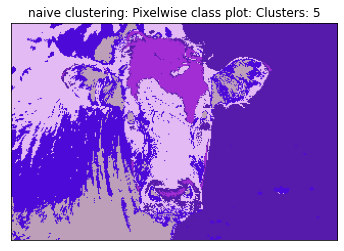

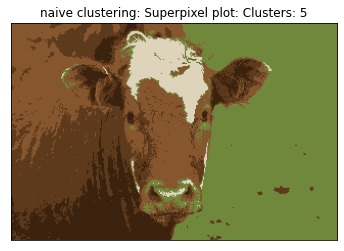

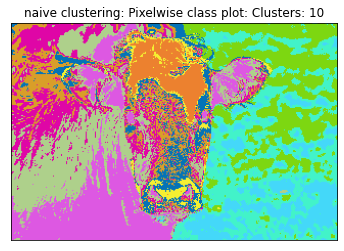

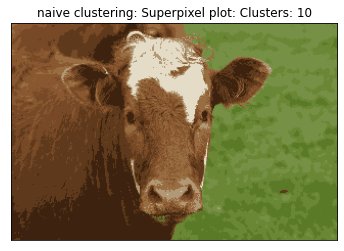

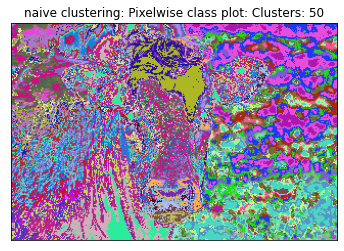

...

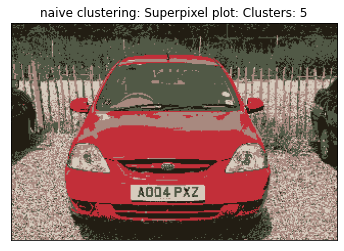

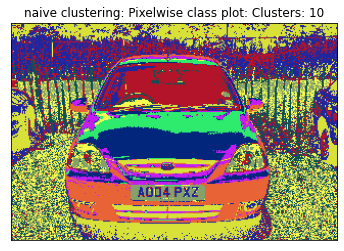

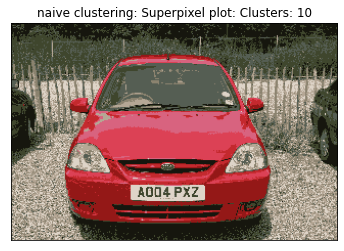

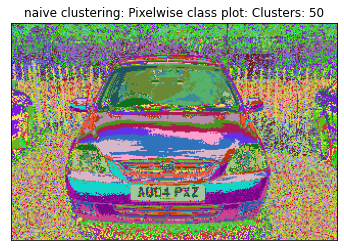

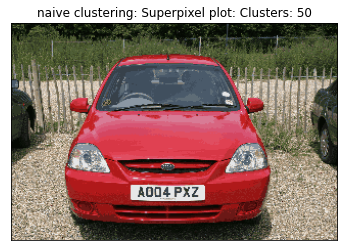

In [6]:
# Kmeans function call
for im_path in im_list:
    im = cv2.imread(im_path)
    for k in [5,10,50]:
        clusters = cluster_pixels(im,k)        
        _ = rgb_segment(clusters,n = k, title =  "naive clustering: Pixelwise class plot: Clusters: " + str(k),legend = False)
        superpixel_plot(im,clusters,title =  "naive clustering: Superpixel plot: Clusters: "+ str(k))
    

### Question 2: Perform k-means on image pixels `(r, g, b, x, y)`. (10 points)

Instead of the clustering running on (r,g,b) values, run the clustering on (r,b,g,x,y).

Try with clusters = `5,10,25,50,150`. You only need to plot the cow (`1_22_s.bmp`).
____

 Iteration: 1, norm 405.7322998046875
 Iteration: 2, norm 100.6222915649414
 Iteration: 3, norm 73.41362571716309
 Iteration: 4, norm 64.18685913085938
 Iteration: 5, norm 48.77698516845703
 Iteration: 6, norm 35.7952241897583
 Iteration: 7, norm 23.7744197845459
 Iteration: 8, norm 18.170201301574707
 Iteration: 9, norm 12.698977947235107
 Iteration: 10, norm 8.453251600265503
DONE. Threshold was: 10 
 Iteration: 1, norm 526.2649993896484
 Iteration: 2, norm 311.96549224853516
 Iteration: 3, norm 158.4887466430664
 Iteration: 4, norm 76.69887161254883
 Iteration: 5, norm 46.42708683013916
 Iteration: 6, norm 37.39415740966797
 Iteration: 7, norm 28.860197067260742
 Iteration: 8, norm 26.351502418518066
 Iteration: 9, norm 23.427815437316895
 Iteration: 10, norm 24.021583557128906
 Iteration: 11, norm 21.34718656539917
 Iteration: 12, norm 12.75322151184082
DONE. Threshold was: 20 
 Iteration: 1, norm 858.1563720703125
 Iteration: 2, norm 261.27354431152344
 Iteration: 3, norm 147.0333

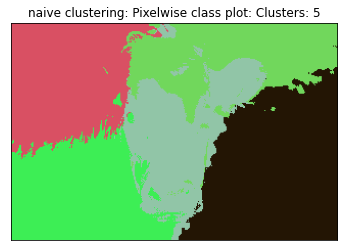

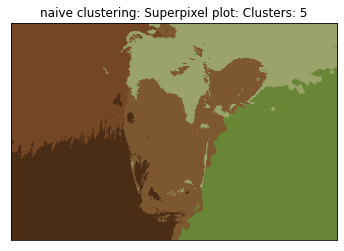

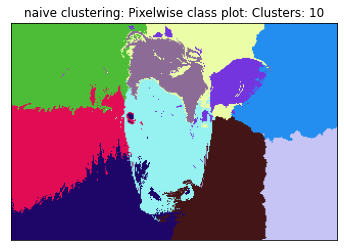

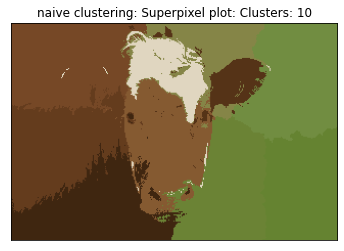

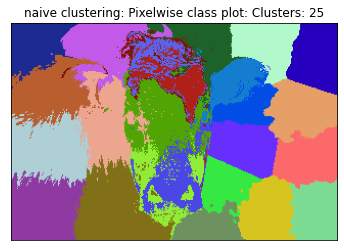

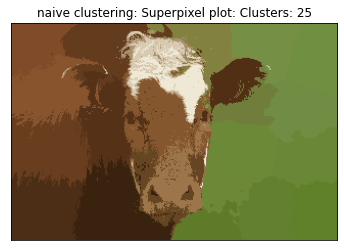

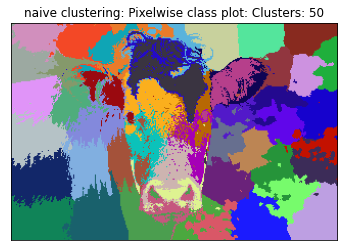

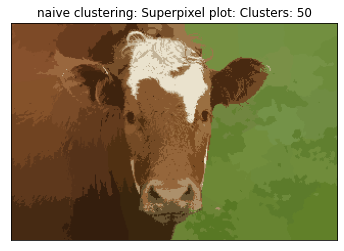

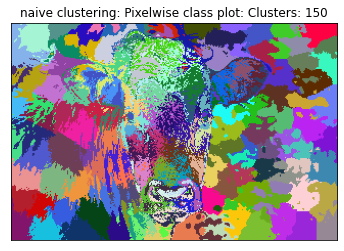

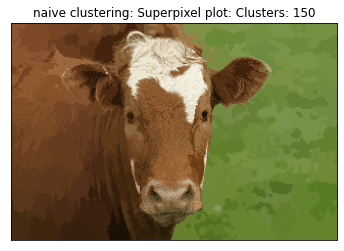

In [7]:
def cluster_rgbxy(im,k, n_iters=20):
    """
    Given image im and asked for k clusters, return nXm size 2D array
    segmap[0,0] is the class of pixel im[0,0,:]
    """
    threshold = k 
    segmap = KMeans(im,k, n_iters, wrgb= 1.0, wxy = 1.0, threshold = threshold)
    return segmap

im = cv2.imread(im_list[0])
for k in [5, 10, 25, 50, 150]:
    clusters = cluster_rgbxy(im,k)
    _ = rgb_segment(clusters,n = k, title =  "naive clustering: Pixelwise class plot: Clusters: " + str(k),legend = False)
    superpixel_plot(im,clusters,title =  "naive clustering: Superpixel plot: Clusters: "+ str(k))


### Question 3: What advantage did the `(r, g, b, x, y)` clustering give, compared to `(r, g, b)`? Please answer in 3 sentences or fewer. (5 points)

# Your Answer:
## 1) Performs a local clustering of pixels. Using only color based clustering ignores local context, which might not be compatible in problems like region proposals, where local context is necessary. 
## 2) enforces compactness and regularity in the clustered shapes - clusters have to be connected together.

---------------------------------------------------------

### Question 4: K-means on image pixels `(r, g, b, x, y)` with weighted distances. (15 points)

 Let: $cluster\_center_i$ be $i^{th}$ cluster center. $cluster\_center_i^{rgb}$ be the rgb value and $cluster\_center_i^{xy}$ be the corresponding coordinate of the pixel.
 
 Let $x_{rgb}$ be the the rgb value of a point
 Let $x_{xy}$ be the coordinate of $x_{rgb}$

Use the following distance function for k-means: $distance(x_{rgb},x_{xy}) = \lambda_1 * euclidean(x_{rgb},cluster\_center_{i}^{rgb})  + \lambda_2 * euclidean(x_{xy},cluster\_center_{i}^{xy})$

Find good values for $\lambda_1$ and $\lambda_2$ for 250 clusters.

With those good values, **plot results for all 6 images in `im_list`.**

 Iteration: 1, norm 44369.52880859375
 Iteration: 2, norm 17591.29379272461
 Iteration: 3, norm 12053.807983398438
 Iteration: 4, norm 9283.495178222656
 Iteration: 5, norm 7598.4869384765625
 Iteration: 6, norm 5820.499114990234
 Iteration: 7, norm 4737.094192504883
 Iteration: 8, norm 3726.446990966797
 Iteration: 9, norm 3176.3222885131836
 Iteration: 10, norm 2918.6693572998047
 Iteration: 11, norm 2813.897705078125
 Iteration: 12, norm 2464.539375305176
 Iteration: 13, norm 2167.463035583496
 Iteration: 14, norm 2172.738151550293
 Iteration: 15, norm 2147.639961242676
 Iteration: 16, norm 2066.7599868774414
 Iteration: 17, norm 1988.70756149292
 Iteration: 18, norm 1894.5445251464844
 Iteration: 19, norm 1930.2865982055664
 Iteration: 20, norm 1807.676887512207
 Iteration: 21, norm 1645.0463485717773
DONE. Threshold was: 250 
 Iteration: 1, norm 49851.5771484375
 Iteration: 2, norm 20055.8642578125
 Iteration: 3, norm 13393.692626953125
 Iteration: 4, norm 10479.58740234375
 Itera

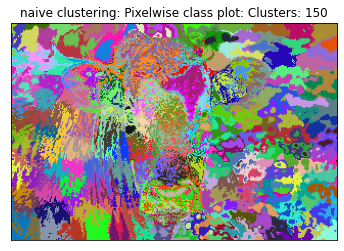

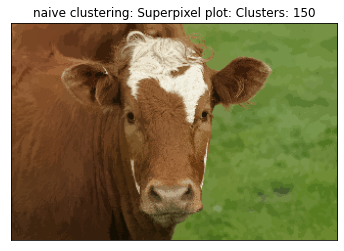

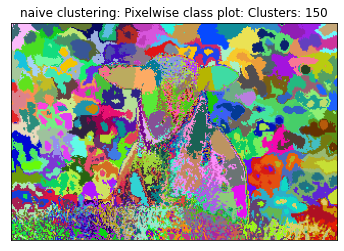

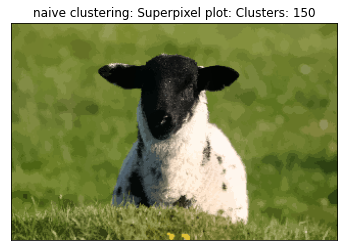

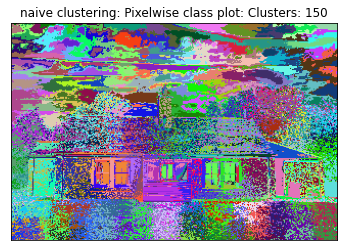

...

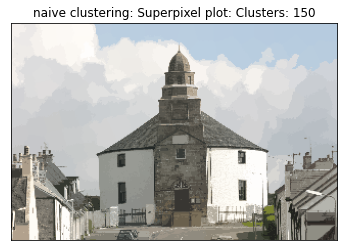

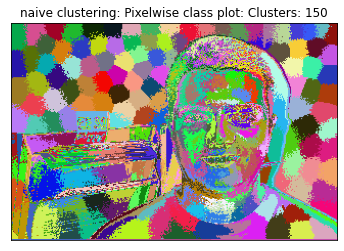

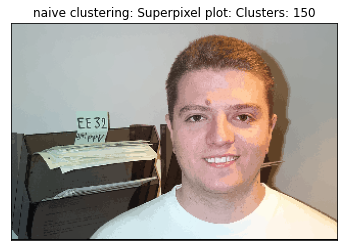

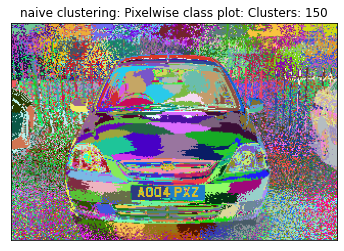

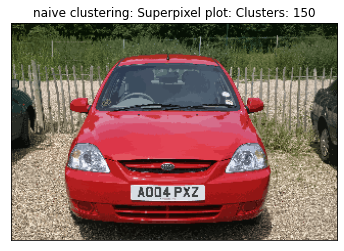

In [8]:
# clustering r,b,g,x,y values with lambdas rgb 25, xy 10 
def cluster_rgbxy(im,k, n_iters=20):
    """
    Given image im and asked for k clusters, return nXm size 2D array
    segmap[0,0] is the class of pixel im[0,0,:]
    """
    threshold = k 
    segmap = KMeans(im,k, n_iters, wrgb= 25.0, wxy = 10.0, threshold = threshold)
    return segmap



for im_path in im_list:
    im = cv2.imread(im_path)
    clusters = cluster_rgbxy(im,k=250)
    _ = rgb_segment(clusters,n = k, title =  "naive clustering: Pixelwise class plot: Clusters: " + str(k),legend = False)
    superpixel_plot(im,clusters,title =  "naive clustering: Superpixel plot: Clusters: "+ str(k))

# Question 5: Replicate SLIC (50 points)

It doesn't look like we have a very favourable outcome with superpixels simply being implemented. Can we do better? Have a look at the SLIC paper [here](https://www.iro.umontreal.ca/~mignotte/IFT6150/Articles/SLIC_Superpixels.pdf). Incorporate S and m and redefine your distance metric as per the paper.

**Finding an existing implementation of SLIC and using it for your assigment would be considered cheating.**

In [55]:
def grid(im):
    # flattened widthwise
    y = np.arange(im.shape[0]); x = np.arange(im.shape[1])
    xx, yy = np.meshgrid(x, y)
    xy = np.dstack((xx, yy)).squeeze()
    return xy.astype(np.float32)

class ClusterNode:
    def __init__(self, rgb, xy):
        self.rgb = np.array(rgb)
        self.center = np.array(xy)
def initialize(im, S):
    h,w = im.shape[:2]
    clusters = []    
    # evenly S-distance spaced, grid of clusters 
    for i in range(S//2, h, S):
        for j in range(S//2, w, S):
            rgb = im[i,j]
            xy = np.array([i,j])
            # instantiate a cluster node
            clusternode = ClusterNode(rgb, xy)
            # assign cluster centers to the local gradient minima.
            clusternode = perturb(im, clusternode)
            clusters.append(clusternode)
    return clusters

def perturb(im, node):
    """
    Step2: Perturb cluster centers in an s×s neighborhood,
     to the lowest gradient position.
    """ 
    h,w = im.shape[:2]   
    min_grad = np.inf

    yc, xc = node.center
    # along immediate neighbouring pixels [-1,0,1]
    for i in range(yc-1, yc+2):
        for j in range(xc-1, xc+2):
            # constrain within boundary
            i = min(max(1, i), h-2)
            j = min(max(1, j), w-2)
            # compute derivative - eqn 2 in paper
            gradx = (np.linalg.norm(im[i, j+1] - im[i, j-1]))**2
            grady = (np.linalg.norm(im[i+1, j] - im[i-1, j]))**2  
            grad = gradx + grady
            # update cluster center if grad moves towards minima
            if grad < min_grad:
                min_grad = grad
                node.center = np.array([i, j])
                node.rgb = im[i, j]
    return node

def euclidean_distance(pixel, center, wrgb, wxy):
    rgb, xy = pixel
    rgb_center, xy_center = center
    # compute individual euclidean distances
    drgb = np.linalg.norm(rgb - rgb_center, ord=2)
    dxy = np.linalg.norm(xy - xy_center, ord=2)
    Ds = (wrgb * drgb**2 + dxy * dxy**2)**0.5
    return Ds        
    # doesnt work idk why
    # Ds = wrgb * np.sqrt(np.sum((rgb - rgb_center)**2)) + wxy * np.sqrt(np.sum((xy - xy_center)**2))

def assigntoClusters(im,segmap,distance_map, clusters, m, S):
    """
    Step 4: 
    for each cluster Ck: 
        Assign the best matching pixels from a 2S ×2S square neighborhood around
        the cluster center according to the distance measure (Eq. 1).
    """
    h,w = im.shape[:2]
    for index, node in enumerate(clusters):
        yc, xc = node.center.astype(np.int32)
        # along a search space -S to +S
        for i in range(yc-S, yc+S):
            for j in range(xc-S, xc+S):
                # constrain within boundary
                i = min(max(0, i), h-1)
                j = min(max(0, j), w-1)
                # select the pixel and the center
                rgb = im[i,j]
                xy = np.array([i,j])
                rgb_center = node.rgb
                xy_center = np.array([yc,xc])

                # find distance between pixel and center
                d = euclidean_distance((rgb, xy), (rgb_center, xy_center), wrgb=1, wxy=m/S)
                # update distance map
                if d < distance_map[i,j]:
                    distance_map[i,j] = d
                    segmap[i,j] = index + 1
    return segmap, distance_map, clusters


def updateClusters(im, clusters, seg_map, xy_grid):
    """
    Step 5: Compute new cluster centers and residual error E {L1 distance between previous
    #centers and recomputed centers}
    """
    cluster_out = []
    for index, node in enumerate(clusters):
        # retrieve all pixels of current cluster
        rgb = im[seg_map == index+1]
        xy = xy_grid[seg_map == index+1]
        # update rgb, xy        
        node.rgb = rgb.mean(axis=0)
        node.center = xy.mean(axis=0)
        cluster_out.append(node)
    return cluster_out

def l1_distance(curr_clusters, prev_clusters):
    l1_norm = np.linalg.norm((np.array(curr_clusters) - np.array(prev_clusters)), ord=1)
    return l1_norm 

from collections import deque

def connectClusters(segmap, min_nk):
    def retrieveNeighbors(node, boundaries):
        directions = np.array([[0,1],[0,-1],[1,0],[-1,0]])    
        h,w = boundaries
        y,x = node
        for dy_dx in directions:
            dy,dx = dy_dx
            x1, y1 = x+dx, y+dy
            if (0<=x1<w) and (0<=y1<h):
                yield (y1,x1)

    h,w = segmap.shape[:2]
    new_segmap = -1*np.ones((h,w))
    
    new_id = 0  # for the new_seg_map
    adjacent = 0    
    min_nk = int(min_nk)
    # for every pixel in segmap:
    for i in range(h):
        for j in range(w):
            curr_label = segmap[i, j]
            # if curr pixel is not assigned to a cluster
            if new_segmap[i, j] == -1:
                # Do BFS to initialise the new segmap with cluster id of immediate neighbours
                queue = deque()
                queue.append((i, j))
                visited = set()
                while len(queue):
                    node = queue.popleft()
                    visited.add(node)
                    for neighbor in retrieveNeighbors(node, (h,w)):
                        if ((new_segmap[neighbor] == -1) and (segmap[neighbor] == curr_label)):
                            queue.append(neighbor)
                            new_segmap[neighbor] = new_id            
                            curr_nk = len(visited)
                            if curr_nk < min_nk :
                                if new_segmap[neighbor] > -1:
                                    adjacent = new_segmap[neighbor]
                                                                           
                    # assign the label in all visited nodes
                    for loc in visited:
                        new_segmap[loc] = adjacent
                else:
                    new_id += 1
    return new_segmap
                    
def iterative_clustering(im_, k, connect_clusters=True, m=10, n_iters=10, threshold=5):
    h, w = im_.shape[0], im_.shape[1]    
    im = cv2.cvtColor(im_.copy(), cv2.COLOR_BGR2LAB).astype(np.float64)

    segmap = -1 * np.ones((h, w))
    distance_map =  np.inf * np.ones((h, w))
    xy_grid = grid(im)
    N = h*w  
    N_k = N/k
    S = int(np.sqrt(N_k))
    clusters = initialize(im, S) # Step 1 and 2
    iteration = 0

    res_error = np.inf

    while not res_error<=threshold and iteration < n_iters:     # Step 3: repeat
        prev_clusters = [np.copy(np.append(c.rgb, c.center)) for c in clusters]          

        segmap, distance_map, clusters = assigntoClusters(im, segmap, distance_map, clusters, m, S) # Step 4-6     
        clusters = updateClusters(im, clusters, segmap, xy_grid) # Step 7
        
        curr_clusters = [np.copy(np.append(c.rgb, c.center)) for c in clusters]
        
        res_error = l1_distance(prev_clusters, curr_clusters) # Step 8 compute residual error: L1 distance
        iteration += 1
        print(f"Iteration: {iteration}, residual error {res_error}")
        # break
    print(f"Done at Threshold {threshold}| error {res_error}")
    
    # enforce connectivity
    if connect_clusters:
        segmap = connectClusters(segmap.copy(), min_nk=N_k) # step 9
    return segmap

def SLIC(im, k, connect_clusters=False):
    """
    Input arguments: 
    im: image input
    k: number of cluster segments
    
    Compute
    S: As described in the paper
    m: As described in the paper (use the same value as in the paper)
    follow the algorithm..
    
    returns:
    segmap: 2D matrix where each value corresponds to the image pixel's cluster number
    """
    return iterative_clustering(im, k, connect_clusters, m=10, n_iters=10)

With SLIC implemented, plot results for all 6 images.

Iteration: 1, residual error 9391.899765014648
Iteration: 2, residual error 787.9736404418945
Iteration: 3, residual error 271.48568534851074
Iteration: 4, residual error 99.88977336883545
Iteration: 5, residual error 37.00425338745117
Iteration: 6, residual error 14.905471945633188
Iteration: 7, residual error 5.667179784441778
Iteration: 8, residual error 3.540623103822142
Done at Threshold 5| error 3.540623103822142
Iteration: 1, residual error 9403.554230690002
Iteration: 2, residual error 1242.713158607483
Iteration: 3, residual error 495.2525520324707
Iteration: 4, residual error 175.70728874206543
Iteration: 5, residual error 45.44806721393613
Iteration: 6, residual error 16.436534881591797
Iteration: 7, residual error 6.5313262939453125
Iteration: 8, residual error 2.6785251167172106
Done at Threshold 5| error 2.6785251167172106
Iteration: 1, residual error 9420.740124702454
Iteration: 2, residual error 952.5098791122437
Iteration: 3, residual error 240.46475887298584
Iteration

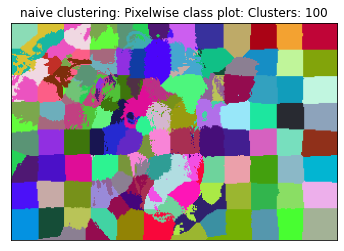

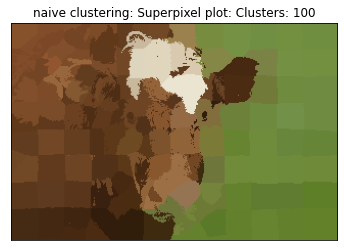

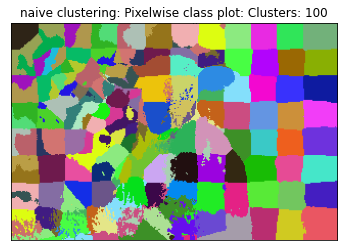

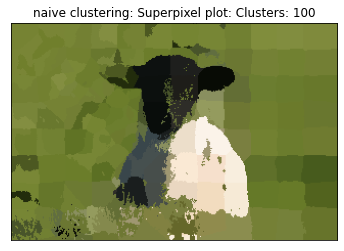

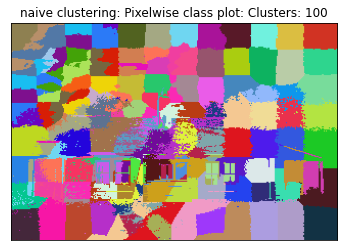

...

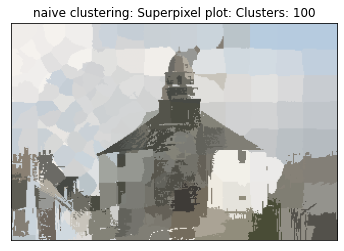

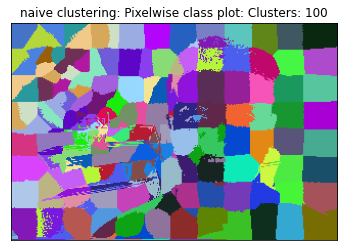

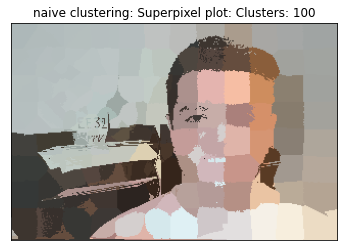

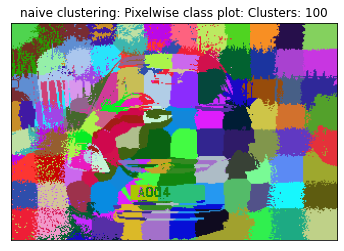

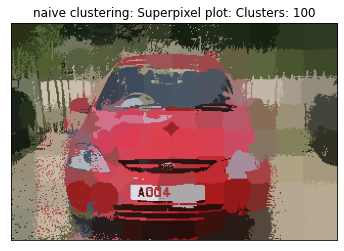

In [53]:
############Algorithm############
#Compute grid steps: S
#you can explore different values of m
#initialize cluster centers [l,a,b,x,y] using  
#Perturb for minimum G
#while not converged
##for every pixel:
####  compare distance D_s with each cluster center within 2S X 2S. 
####  Assign to nearest cluster
##calculate new cluster center 

k=100
for i, im_path in enumerate(im_list):
    im = cv2.imread(im_path)
    segmap = SLIC(im, k=k, connect_clusters=False)
    _ = rgb_segment(segmap,n = k, title =  "naive clustering: Pixelwise class plot: Clusters: " + str(k),legend = False)
    superpixel_plot(im,segmap,title =  "naive clustering: Superpixel plot: Clusters: "+ str(k))

### Bonus Question: Enforce connectivity (20 points)
There are many superpixels which are very small and disconnected from each other. Merge them with larger superpixels

O(N) algorithm:
1. Set minimum size of superpixel
2. If region smaller than threshold, assign to nearest cluster 

Plot results for the 6 images.


Iteration: 1, residual error 9391.899765014648
Iteration: 2, residual error 787.9736404418945
Iteration: 3, residual error 271.48568534851074
Iteration: 4, residual error 99.88977336883545
Iteration: 5, residual error 37.00425338745117
Iteration: 6, residual error 14.905471945633188
Iteration: 7, residual error 5.667179784441778
Iteration: 8, residual error 3.540623103822142
Done at Threshold 5| error 3.540623103822142
Iteration: 1, residual error 9403.554230690002
Iteration: 2, residual error 1242.713158607483
Iteration: 3, residual error 495.2525520324707
Iteration: 4, residual error 175.70728874206543
Iteration: 5, residual error 45.44806721393613
Iteration: 6, residual error 16.436534881591797
Iteration: 7, residual error 6.5313262939453125
Iteration: 8, residual error 2.6785251167172106
Done at Threshold 5| error 2.6785251167172106
Iteration: 1, residual error 9420.740124702454
Iteration: 2, residual error 952.5098791122437
Iteration: 3, residual error 240.46475887298584
Iteration

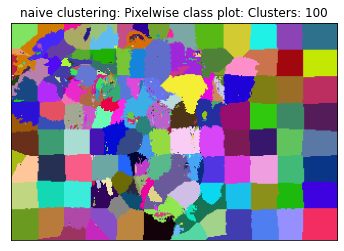

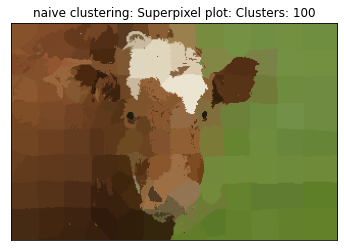

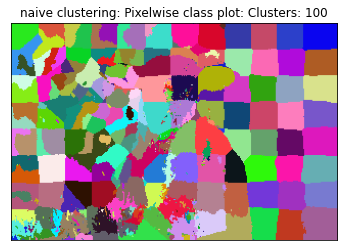

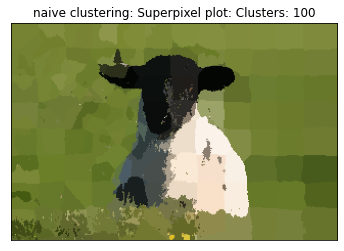

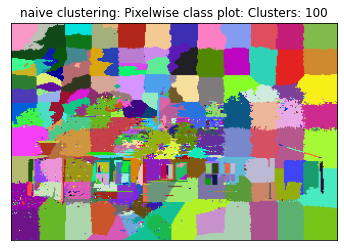

...

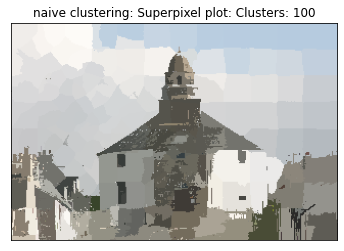

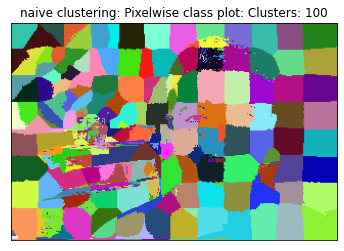

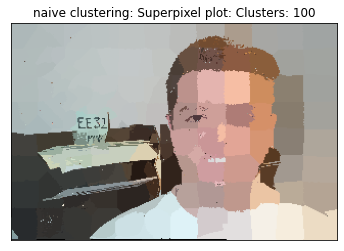

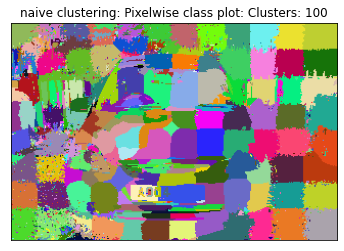

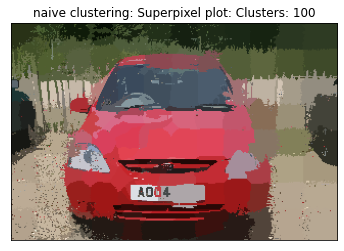

In [54]:
k=100
for im_path in im_list:
    im = cv2.imread(im_path)
    segmap = SLIC(im, k=k, connect_clusters=True)
    _ = rgb_segment(segmap,n = k, title =  "naive clustering: Pixelwise class plot: Clusters: " + str(k),legend = False)
    superpixel_plot(im,segmap,title =  "naive clustering: Superpixel plot: Clusters: "+ str(k))